<a href="https://colab.research.google.com/github/riken-emar/MI-TDNMR/blob/main/ssnmf20230210.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from scipy.fftpack import fft, ifft
import scipy.signal as sig
import matplotlib.pyplot as plt
import matplotlib.cm
import numpy as np
import pandas as pd
from numpy.random import randn
import csv
import cmath
import math
import tkinter
from matplotlib.backends.backend_tkagg  import FigureCanvasTkAgg, NavigationToolbar2Tk
from tkinter import messagebox

import numpy as np
import os
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline
#%matplotlib
#%matplotlib notebook
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
!pip install git+https://github.com/keik/nmftools.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/keik/nmftools.git to /tmp/pip-req-build-53jvz1mz
  Running command git clone --filter=blob:none --quiet https://github.com/keik/nmftools.git /tmp/pip-req-build-53jvz1mz
  Resolved https://github.com/keik/nmftools.git to commit b826448292026ba160773762092651a665e58898
  Preparing metadata (setup.py) ... done
  Created wheel for nmftools: filename=nmftools-0.0.1rc0-py3-none-any.whl size=2442 sha256=351d049879fee94cf76baedff46bdbb709d4342ec585e0964d8926344d01efbf
  Stored in directory: /tmp/pip-ephem-wheel-cache-ij1keb7m/wheels/15/a3/d8/749a298833f1fb7baf1437b9071ec280fe7fd45a6a692620ff
Successfully built nmftools


In [ ]:
!pip install pandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from nmftools import ssnmf ,nmf
import pandas as pd

In [ ]:
df = pd.read_csv('preprocessedData-cpmg20230210py.csv', index_col=0)
df =df

rss = 0.07845545497955358
rss = 0.01297182235222348
rss = 0.006324996197984803
rss = 0.0035701900626208902
rss = 0.00310309855019805
rss = 0.002898792045170331
rss = 0.0028446771500752507
rss = 0.002822077803620303
rss = 0.002726463612111584
rss = 0.0026794064032689938


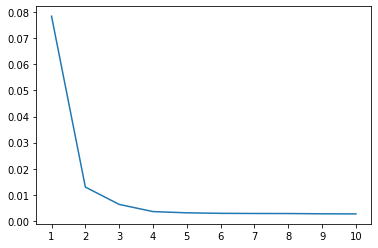

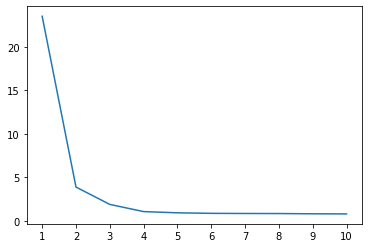

In [ ]:
# 残差平方和(RSS)

# In[1]

import numpy as np

# 残差平方和(RSS)を定義
def rss(y, t):
    f = 0.5 * np.sum((y - t)**2) / y.shape[0]

    return f

import numpy as np
import matplotlib.pyplot as plt
df = pd.read_csv('preprocessedData-cpmg20230210py.csv', index_col=0)
df=df
rssall=[]
costall=[]
k=10
for i in range(1,k+1):
 #out = ssnmf(df.values, R=i, n_iter=10000, F=df.values[:,-3:], init_G=[], init_H=[], init_U=[], verbose=False)
 out = nmf(df.values, R=i, n_iter=10000, init_H=[], init_U=[], verbose=False)
 resig1 = np.dot(out[0],out[1])
 #resig2 = np.dot(out[2],out[3])
 resig3 = resig1#+ resig2
 rss2 = rss(df.values, resig3)
 print("rss = {}".format(rss2))
 rssall.append(rss2)
 costall.append(out[2][-1])
rank=range(1,k+1)
plt.plot(rank,rssall)
plt.xticks(rank)
plt.show()
rssallout= pd.DataFrame(rssall)
rssallout.to_csv("rssallout_20230210nmf.csv")

plt.plot(rank,costall)
plt.xticks(rank)
plt.show()
costallout= pd.DataFrame(costall)
costallout.to_csv("costallout_20230210nmf.csv")

rss = 0.014880482435429668
rss = 0.009576709117808588
rss = 0.005087904309958176
rss = 0.0035822432152427842
rss = 0.0030646002827415934
rss = 0.002905374623935245
rss = 0.002822693169148661
rss = 0.002767431195666238
rss = 0.0026986159993457716
rss = 0.0026671162292989416


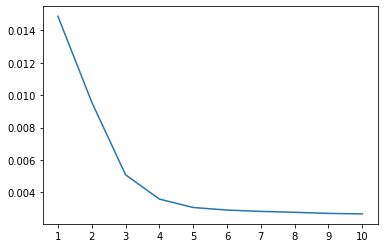

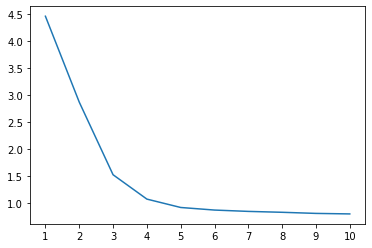

In [ ]:
# 残差平方和(RSS)

# In[1]

import numpy as np

# 残差平方和(RSS)を定義
def rss(y, t):
    f = 0.5 * np.sum((y - t)**2) / y.shape[0]

    return f

import numpy as np
import matplotlib.pyplot as plt
df = pd.read_csv('preprocessedData-cpmg20230210py.csv', index_col=0)
df=df
rssall=[]
costall=[]
k=10
for i in range(1,k+1):
 out = ssnmf(df.values, R=i, n_iter=10000, F=df.values[:,-1:], init_G=[], init_H=[], init_U=[], verbose=False)
 #out = nmf(df.values, R=i, n_iter=1000, init_H=[], init_U=[], verbose=False)
 resig1 = np.dot(out[0],out[1])
 resig2 = np.dot(out[2],out[3])
 resig3 = resig1+ resig2
 rss2 = rss(df.values, resig3)
 print("rss = {}".format(rss2))
 rssall.append(rss2)
 costall.append(out[4][-1])
rank=range(1,k+1)
plt.plot(rank,rssall)
plt.xticks(rank)
plt.show()
rssallout= pd.DataFrame(rssall)
rssallout.to_csv("rssallout_20230210ssnmf.csv")

plt.plot(rank,costall)
plt.xticks(rank)
plt.show()
costallout= pd.DataFrame(costall)
costallout.to_csv("costallout_20230210ssnmf.csv")

In [ ]:
#out = nmf(df.values, R=10, n_iter=10000, init_H=[], init_U=[], verbose=False)

#out = ssnmf(df.values, R=8, n_iter=10000, F=df.values[:,-1:], init_G=[], init_H=[], init_U=[], verbose=True)
#out = ssnmf(df.values, R=20, n_iter=10000, F=df.values[:,-1:], init_G=out1[1], init_H=out1[2], init_U=out1[3], verbose=False)

n=5
out = ssnmf(df.values, R=n, n_iter=10000, F=df.values[:,-1:], init_G=[], init_H=[], init_U=[], verbose=True)
#out = ssnmf(df.values, R=n, n_iter=10000, F=df.values[:,-1:], init_G=out[1], init_H=out[2], init_U=out[3], verbose=True)

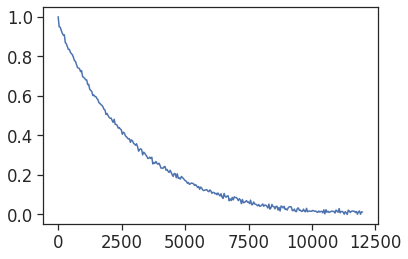

In [ ]:
plt.plot(df.iloc[:,-1:])
#plt.plot(df.iloc[:,118:120])
plt.show()

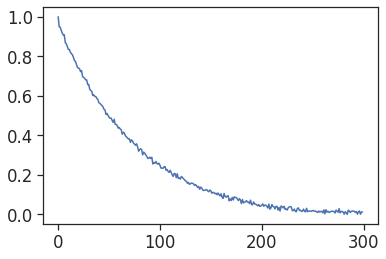

In [ ]:
for i in range(len(out[0].T)):
 plt.plot(out[0].T[i])
 plt.show()

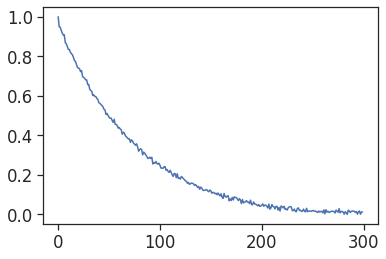

In [ ]:
plt.plot(out[0])
plt.show()

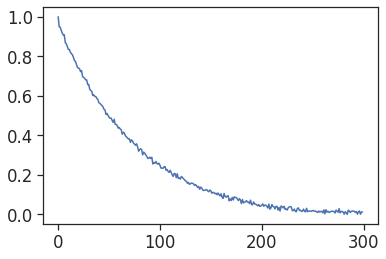

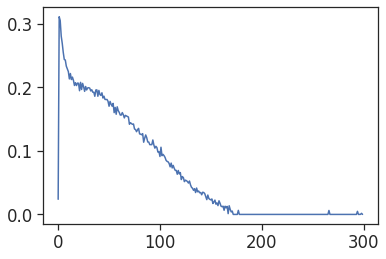

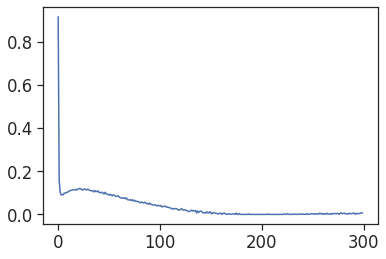

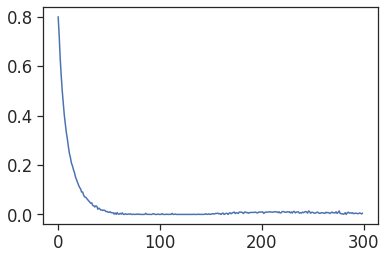

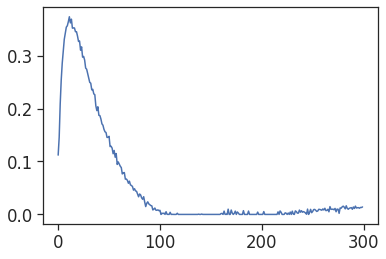

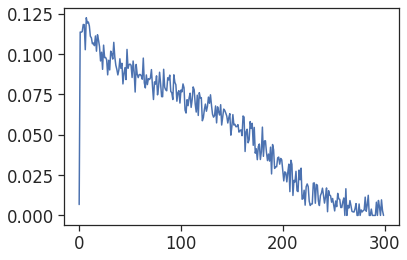

In [ ]:
plt.plot(out[0])
plt.show()
for i in range(len(out[2].T)):
 plt.plot(out[2].T[i])
 plt.show()

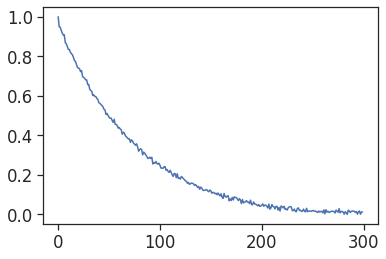

In [ ]:
plt.plot(out[0])
plt.show()

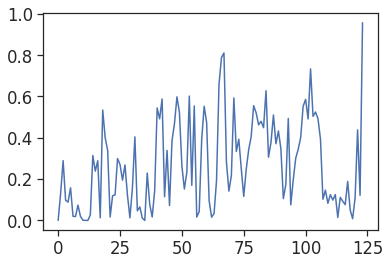

In [ ]:
for i in range(len(out[1])):
 plt.plot(out[1][i])
 plt.show()

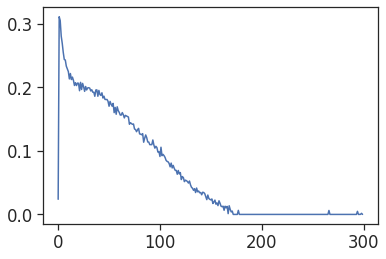

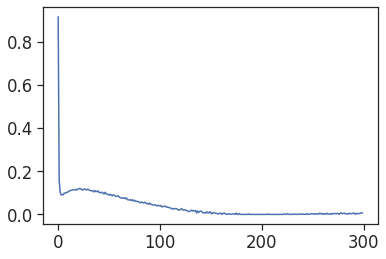

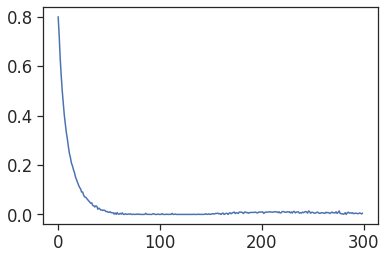

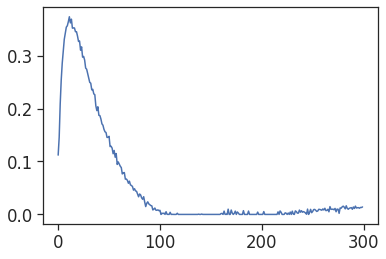

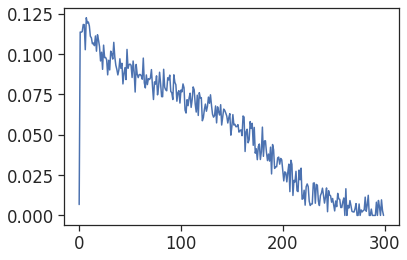

In [ ]:
for i in range(len(out[2].T)):
 plt.plot(out[2].T[i])
 plt.show()
#plt.plot(out[2].T[0]+out[2].T[1])
#plt.show()

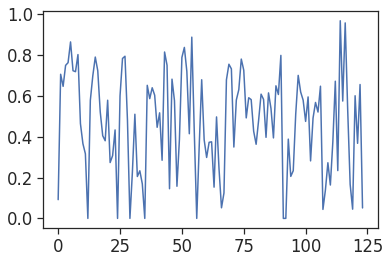

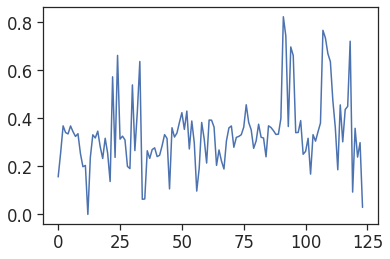

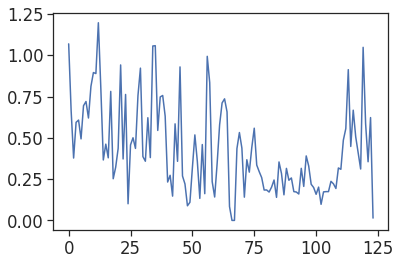

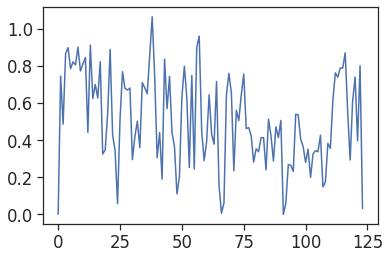

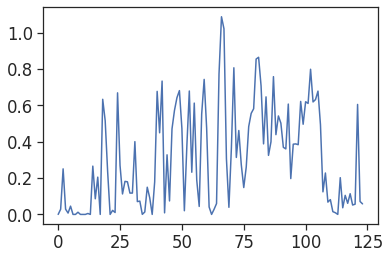

In [ ]:
for i in range(len(out[3])):
 plt.plot(out[3][i])
 plt.show()

In [ ]:
print(out[3])

[[9.18036364e-02 7.05651095e-01 6.46491385e-01 7.49150484e-01
  7.62478459e-01 8.64042105e-01 7.23161639e-01 7.18327034e-01
  8.02056751e-01 4.63982131e-01 3.65865904e-01 3.16315986e-01
  1.32192526e-68 5.78178612e-01 6.98519206e-01 7.89907724e-01
  7.22981923e-01 5.21893367e-01 4.04863203e-01 3.80213446e-01
  5.78593380e-01 2.73527337e-01 3.07416360e-01 4.33141601e-01
  2.39154636e-06 6.00101114e-01 7.83033585e-01 7.93875297e-01
  4.81784221e-01 1.22841815e-04 2.27715158e-01 5.09990533e-01
  2.05118292e-01 2.33126490e-01 1.69575100e-01 4.53622142e-33
  6.51543196e-01 5.86356990e-01 6.39637484e-01 6.03126254e-01
  4.46056693e-01 5.16920117e-01 2.84673081e-01 8.14644115e-01
  7.49722327e-01 1.45381765e-01 6.81737051e-01 5.76471349e-01
  1.57383346e-01 3.86414929e-01 7.88065272e-01 8.37111381e-01
  7.19790781e-01 4.14548179e-01 8.87401730e-01 4.27513242e-01
  1.00896145e-04 3.54608284e-01 6.78841617e-01 3.84916321e-01
  2.98486866e-01 3.72583970e-01 3.75005067e-01 1.53092244e-01
  4.9688

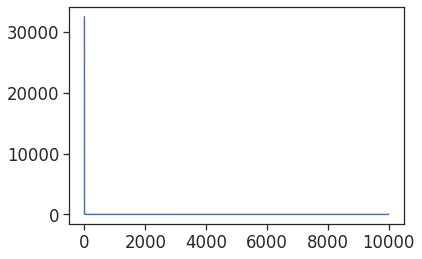

In [ ]:
plt.plot(out[4])
plt.show()

In [ ]:
import numpy as np
resig1 = np.dot(out[0],out[1])#+np.dot(out[2],out[3])

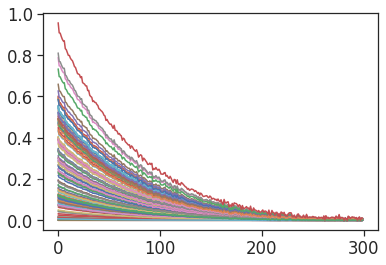

In [ ]:
plt.plot(resig1)

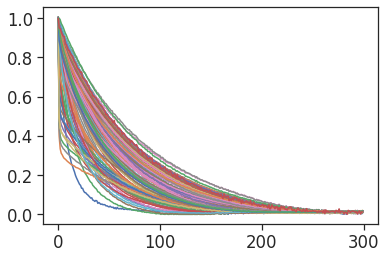

In [ ]:
resig22 = np.dot(out[2],out[3])
resig3 = resig1+ resig22
plt.plot(resig3)

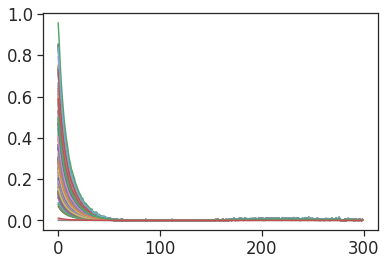

In [ ]:
#resig2 = np.dot(out[2],out[3])
k=2
comp1=out[3].copy()
comp2=out[3].copy()
comp1[:,:] = 0
comp1[k,:] = comp2[k,:]
resig2 = np.dot(out[2],comp1)
plt.plot(resig2)


0


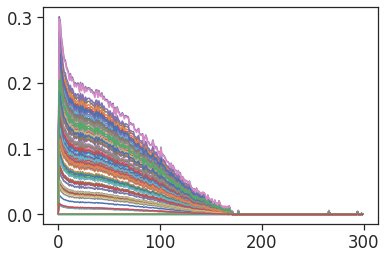

1


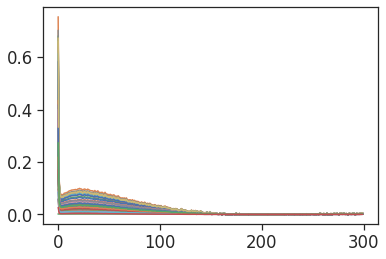

2


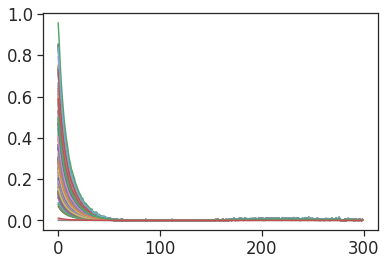

3


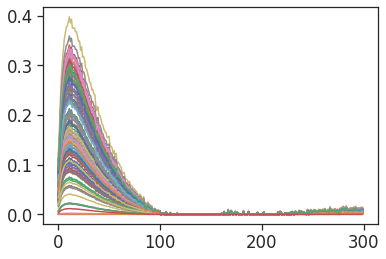

4


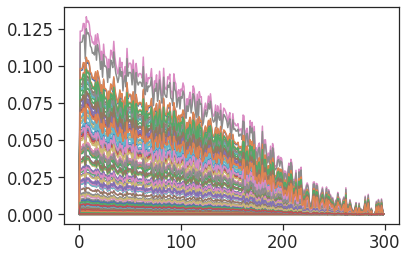

5


IndexError: ignored

In [ ]:
#n=8
#out = ssnmf(df.values, R=n, n_iter=10000, F=df.values[:,-1:], init_G=[], init_H=[], init_U=[], verbose=True)
#out = ssnmf(df.values, R=n, n_iter=10000, F=df.values[:,-1:], init_G=out[1], init_H=out[2], init_U=out[3], verbose=True)

k=0
print(k)
comp1=out[3].copy()
comp2=out[3].copy()
comp1[:,:] = 0
comp1[k,:] = comp2[k,:]
resigcomp0 = np.dot(out[2],comp1)
plt.plot(resigcomp0)
plt.show()

k=1
print(k)
comp1=out[3].copy()
comp2=out[3].copy()
comp1[:,:] = 0
comp1[k,:] = comp2[k,:]
resigcomp1 = np.dot(out[2],comp1)
plt.plot(resigcomp1)
plt.show()
k=2
print(k)
comp1=out[3].copy()
comp2=out[3].copy()
comp1[:,:] = 0
comp1[k,:] = comp2[k,:]
resigcomp2 = np.dot(out[2],comp1)
plt.plot(resigcomp2)
plt.show()
k=3
print(k)
comp1=out[3].copy()
comp2=out[3].copy()
comp1[:,:] = 0
comp1[k,:] = comp2[k,:]
resigcomp3 = np.dot(out[2],comp1)
plt.plot(resigcomp3)
plt.show()
k=4
print(k)
comp1=out[3].copy()
comp2=out[3].copy()
comp1[:,:] = 0
comp1[k,:] = comp2[k,:]
resigcomp4 = np.dot(out[2],comp1)
plt.plot(resigcomp4)
plt.show()
k=5
print(k)
comp1=out[3].copy()
comp2=out[3].copy()
comp1[:,:] = 0
comp1[k,:] = comp2[k,:]
resigcomp5 = np.dot(out[2],comp1)
plt.plot(resigcomp5)
plt.show()
k=6
print(k)
comp1=out[3].copy()
comp2=out[3].copy()
comp1[:,:] = 0
comp1[k,:] = comp2[k,:]
resigcomp6 = np.dot(out[2],comp1)
plt.plot(resigcomp6)
plt.show()
k=7
print(k)
comp1=out[3].copy()
comp2=out[3].copy()
comp1[:,:] = 0
comp1[k,:] = comp2[k,:]
resigcomp7 = np.dot(out[2],comp1)
plt.plot(resigcomp7)
plt.show()
k=8
print(k)
comp1=out[3].copy()
comp2=out[3].copy()
comp1[:,:] = 0
comp1[k,:] = comp2[k,:]
resigcomp8 = np.dot(out[2],comp1)
plt.plot(resigcomp8)
plt.show()
k=9
print(k)
comp1=out[3].copy()
comp2=out[3].copy()
comp1[:,:] = 0
comp1[k,:] = comp2[k,:]
resigcomp9 = np.dot(out[2],comp1)
plt.plot(resigcomp9)
plt.show()

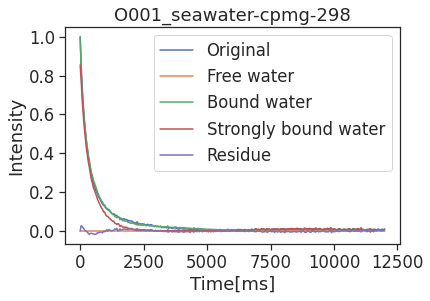

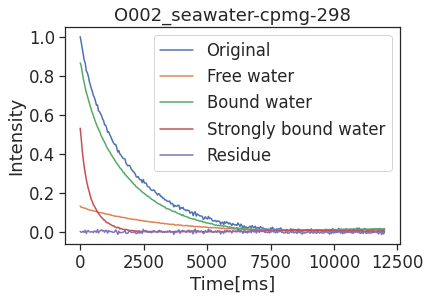

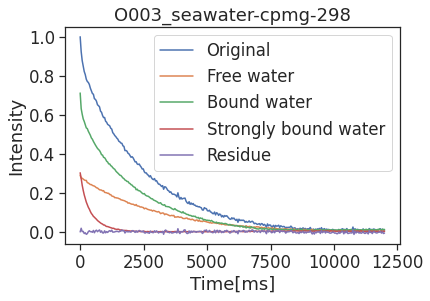

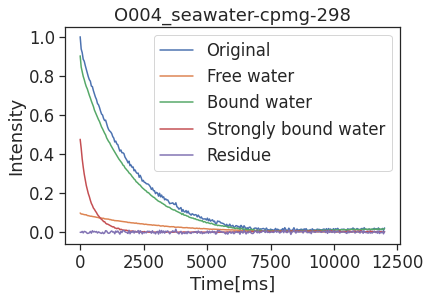

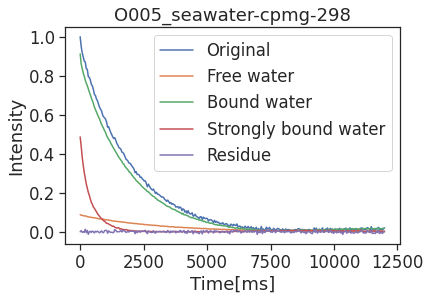

...

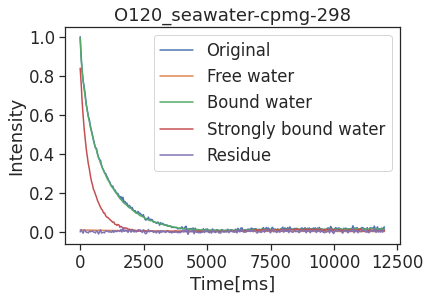

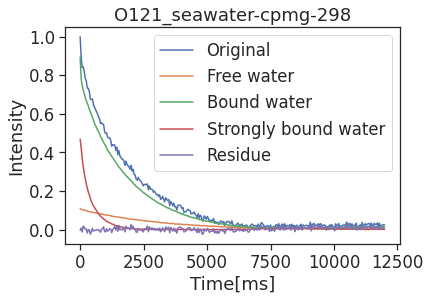

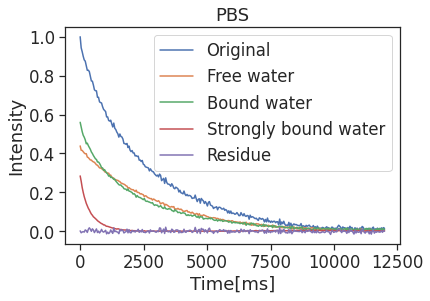

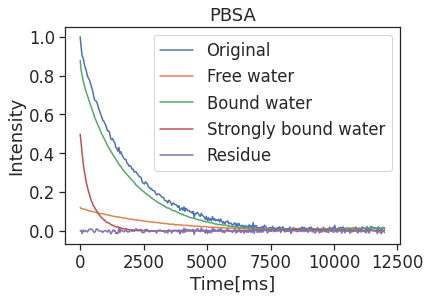

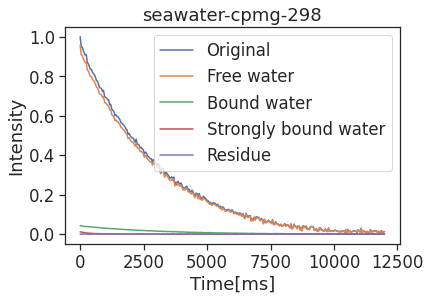

In [ ]:
resig1 = np.dot(out[0],out[1])
resigcomp555=resigcomp0+resigcomp1+resigcomp2+resigcomp3+resigcomp4#+resigcomp5#+resigcomp6#+resigcomp7+resigcomp8+resigcomp9#+resigcomp10+resigcomp11+resigcomp12+resigcomp13+resigcomp14+resigcomp15+resigcomp16+resigcomp17+resigcomp18+resigcomp19
resigcomp333=resigcomp0+resigcomp1+resigcomp3+resigcomp4#+resigcomp5#+resigcomp6#+resigcomp7+resigcomp8#+resigcomp9#+resigcomp11+resigcomp12+resigcomp13+resigcomp14+resigcomp15+resigcomp16+resigcomp17+resigcomp0+resigcomp19
resigcomp33344=resigcomp2
resigcomp3333=df.values-resig1-resigcomp333#resigcomp0+resigcomp2+resigcomp1+resigcomp3+resigcomp5+resigcomp6+resigcomp7+resigcomp9+resigcomp8
resigcomp9999=df.values-resig1-resigcomp555#resigcomp0+resigcomp2+resigcomp1+resigcomp3+resigcomp5+resigcomp6+resigcomp7+resigcomp9+resigcomp8
for i in range(len(df.values[0,:])):
 plt.plot(df.index,df.values[:,i], label="Original")
 plt.plot(df.index,resig1[:,i], label="Free water")
 plt.plot(df.index,resigcomp555[:,i], label="Bound water")
 #plt.plot(df.index,resigcomp333[:,i], label="Weakly bound water")
 plt.plot(df.index,resigcomp33344[:,i], label="Strongly bound water")
 #plt.plot(df.index,resigcomp3333[:,i], label="Comp3")
 plt.plot(df.index,resigcomp9999[:,i], label="Residue")
 plt.title(df.columns[i])
 plt.xlabel("Time[ms]")
 plt.ylabel("Intensity")
 plt.legend()
 plt.show()

In [ ]:
dfresig1= pd.DataFrame(resig1)
dfresig1.to_csv("resig1_20230210.csv")
resigcomp555= pd.DataFrame(resigcomp555)
resigcomp555.to_csv("boundwater_20230210.csv")
resigcomp333= pd.DataFrame(resigcomp333)
resigcomp333.to_csv("weaklyboundwater_20230210.csv")
resigcomp33344= pd.DataFrame(resigcomp33344)
resigcomp33344.to_csv("stronglyboundwater_20230210.csv")
resigcomp3333= pd.DataFrame(resigcomp3333)
resigcomp3333.to_csv("restronglyboundwater_20230210.csv")
resigcomp9999= pd.DataFrame(resigcomp9999)
resigcomp9999.to_csv("residue_20230210.csv")

In [ ]:
dfresig1= pd.DataFrame(resig1)
dfresig1.to_csv("resig1_20230210.csv")

In [ ]:
resig2 = np.dot(out[2],out[3])
dfresig2= pd.DataFrame(resig2)
dfresig2.to_csv("resig2_20230210.csv")

In [ ]:
dfout0= pd.DataFrame(out[0])
dfout0.to_csv("out0_20230210.csv")

In [ ]:
dfout1= pd.DataFrame(out[1])
dfout1.to_csv("out1_20230210.csv")

In [ ]:
dfout2= pd.DataFrame(out[2])
dfout2.to_csv("out2_20230210.csv")

In [ ]:
dfout3= pd.DataFrame(out[3])
dfout3.to_csv("out3_20230210.csv")

In [ ]:
dfout4= pd.DataFrame(out[4])
dfout4.to_csv("out4_20230210.csv")

In [ ]:
import pandas as pd
df = pd.read_csv('preprocessedData-cpmg20230210py.csv', index_col=0)
df =df

In [ ]:
df

,O001_seawater-cpmg-298,O002_seawater-cpmg-298,O003_seawater-cpmg-298,O004_seawater-cpmg-298,O005_seawater-cpmg-298,O006_seawater-cpmg-298,O007_seawater-cpmg-298,O008_seawater-cpmg-298,O009_seawater-cpmg-298,O010_seawater-cpmg-298,...,O115_seawater-cpmg-298,O116_seawater-cpmg-298,O117_seawater-cpmg-298,O118_seawater-cpmg-298,O119_seawater-cpmg-298,O120_seawater-cpmg-298,O121_seawater-cpmg-298,PBS,PBSA,seawater-cpmg-298
4,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
44,0.852527,0.973412,0.923666,0.937302,0.950046,0.960045,0.923668,0.929363,0.942141,0.897602,...,0.946142,0.939689,0.952580,0.801905,0.482170,0.899343,0.892223,0.942932,0.943974,0.949155
84,0.740711,0.941992,0.877331,0.918583,0.918408,0.924544,0.884920,0.887577,0.936982,0.858309,...,0.906473,0.895019,0.930573,0.774895,0.435099,0.824714,0.840907,0.922722,0.899724,0.947273
124,0.653619,0.911896,0.849642,0.885002,0.896075,0.904235,0.859790,0.864224,0.901747,0.823117,...,0.891007,0.851578,0.893497,0.742447,0.425947,0.769963,0.843911,0.899565,0.890413,0.931302
164,0.581012,0.879434,0.821626,0.875037,0.875167,0.882846,0.818803,0.827288,0.888565,0.791130,...,0.890963,0.836540,0.880105,0.728484,0.417641,0.741702,0.818962,0.880834,0.861153,0.917241
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11830,0.004751,0.015312,0.014899,0.013927,0.009537,0.004358,0.006796,0.009459,0.007897,0.013065,...,0.022965,0.014512,0.007568,0.022701,0.010900,0.009712,0.017052,0.012039,0.009302,0.013168
11871,0.005410,0.001753,0.006934,0.013931,0.013524,0.007555,0.016676,0.019443,0.006156,0.012359,...,0.015673,0.022903,0.016774,0.031393,0.003222,0.017645,0.019003,0.017108,0.001612,0.017568
11911,0.008415,0.012635,0.012268,0.019312,0.008197,0.007981,0.016423,0.006212,0.015803,0.008912,...,0.026641,0.016045,0.020386,0.031271,0.012847,0.010832,0.024634,0.008906,0.018751,0.000910
11951,0.003602,0.003646,0.005676,0.009165,0.017066,0.004218,0.017082,0.019417,0.014601,0.013972,...,0.025047,0.016522,0.028405,0.022665,0.011643,0.020315,0.025174,0.018285,0.014951,0.012660


In [ ]:
import numpy as np

def idx_of_the_nearest(data, value):
    idx = np.argmin(np.abs(np.array(data) - value))
    return idx

In [ ]:
idx = [0]*(len(df.iloc[0,:]))
idxv = [0]*(len(df.iloc[0,:]))
idxY = [0]*(len(df.iloc[0,:]))
for i in range(len(df.iloc[0,:])):
 t2=np.array(df.iloc[:,i])
 idx[i] = idx_of_the_nearest(t2, 1/math.e)
 idxv[i] = df.index[idx[i]]
 idxY[i] = df.iloc[idx[i],i]
print(idx)
print(idxv)
print(idxY)
pd.Series(idx).to_csv("out_t2idx_20230210.csv")
pd.Series(idxv).to_csv("out_t2v_20230210.csv")
pd.Series(idxv).to_csv("out_t2Y_20230210.csv")

[8, 44, 53, 46, 46, 50, 39, 38, 46, 31, 29, 28, 16, 37, 58, 55, 56, 33, 69, 54, 53, 29, 25, 24, 27, 50, 52, 56, 37, 21, 22, 56, 20, 16, 23, 20, 48, 39, 43, 43, 69, 66, 65, 47, 62, 26, 66, 65, 64, 68, 63, 51, 58, 70, 55, 68, 27, 35, 66, 69, 57, 31, 19, 15, 42, 70, 81, 83, 56, 48, 55, 73, 55, 63, 55, 48, 45, 57, 66, 68, 69, 68, 72, 64, 75, 55, 59, 70, 63, 63, 66, 2, 4, 62, 13, 26, 52, 60, 66, 72, 72, 69, 82, 67, 72, 70, 67, 2, 13, 19, 20, 32, 44, 25, 59, 38, 52, 41, 10, 19, 41, 59, 45, 71]
[325, 1768, 2129, 1848, 1848, 2009, 1568, 1527, 1848, 1247, 1167, 1127, 645, 1487, 2329, 2209, 2249, 1327, 2770, 2169, 2129, 1167, 1006, 966, 1086, 2009, 2089, 2249, 1487, 846, 886, 2249, 806, 645, 926, 806, 1928, 1568, 1728, 1728, 2770, 2650, 2610, 1888, 2490, 1046, 2650, 2610, 2570, 2730, 2530, 2049, 2329, 2810, 2209, 2730, 1086, 1407, 2650, 2770, 2289, 1247, 766, 605, 1688, 2810, 3251, 3331, 2249, 1928, 2209, 2931, 2209, 2530, 2209, 1928, 1808, 2289, 2650, 2730, 2770, 2730, 2890, 2570, 3011, 2209, 2

In [ ]:
dfsum=df.sum(axis=0)
dfsum

O001_seawater-cpmg-298    13.259842
O002_seawater-cpmg-298    45.080303
O003_seawater-cpmg-298    52.392179
O004_seawater-cpmg-298    46.330336
O005_seawater-cpmg-298    46.004823
                            ...    
O120_seawater-cpmg-298    23.688588
O121_seawater-cpmg-298    43.246344
PBS                       59.472771
PBSA                      45.235442
seawater-cpmg-298         68.520578
Length: 124, dtype: float64

In [ ]:
dfresig1= pd.DataFrame(resig1)
dfresig1sum=dfresig1.sum(axis=0)
dfresig1sum

0      4.879039e-14
1      9.039137e+00
2      1.983929e+01
3      6.717742e+00
4      6.057579e+00
           ...     
119    5.617606e-01
120    7.498415e+00
121    3.004311e+01
122    8.329392e+00
123    6.557509e+01
Length: 124, dtype: float64

In [ ]:
dfresig2= pd.DataFrame(resig2)
dfresig2sum=dfresig2.sum(axis=0)
dfresig2sum

0      13.762172
1      36.403354
2      32.855656
3      39.559957
4      40.106915
         ...    
119    22.974630
120    34.971476
121    29.647652
122    37.065944
123     2.940416
Length: 124, dtype: float64

In [ ]:
dfresigcomp33344= pd.DataFrame(resigcomp33344)
dfresigcomp33344sum=dfresigcomp33344.sum(axis=0)
dfresigcomp33344sum

0      10.203863
1       6.332917
2       3.605228
3       5.668611
4       5.797984
         ...    
119    10.003492
120     5.590674
121     3.390187
122     5.943254
123     0.134943
Length: 124, dtype: float64

In [ ]:
from scipy import stats
r = stats.pearsonr(dfresig1sum, dfsum)
print(r)
r = stats.pearsonr(dfresig1sum, idxv)
print(r)
r = stats.pearsonr(dfresig1sum, dfresig2sum)
print(r)
r = stats.pearsonr(dfresig1sum, dfresigcomp33344sum)
print(r)

(0.8847432512363427, 2.898134394050417e-42)
(0.8356915435020225, 1.5183129794298045e-33)
(-0.18355941788647573, 0.041280306808564496)
(-0.8160013424213729, 8.020822160560524e-31)


In [ ]:
dfxy = pd.DataFrame({'Original': dfsum.values,
                   'OriginalT2[ms]': idxv,
                   'FreeWater': dfresig1sum,
                   'BoundWater': dfresig2sum,
                   'StronglyBoundWater': dfresigcomp33344sum
                   })
#df_corr = dfcorr.corr()
#print(df_corr)
dfxy.to_csv("dfxy_20230210.csv")

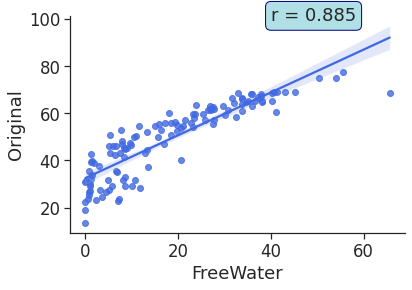

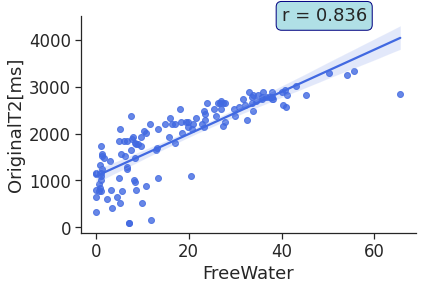

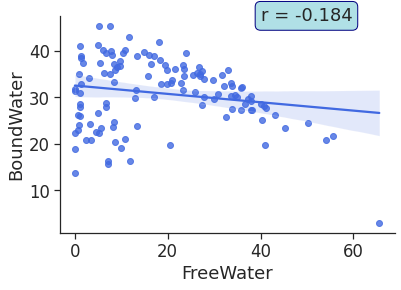

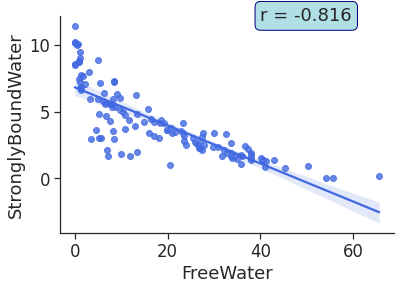

In [ ]:
import seaborn as sns
import scipy.stats as stats
import datetime
import matplotlib.pyplot as plt
now = datetime.datetime.now()

a=dfxy["FreeWater"]
b=dfxy["Original"]
c=dfxy["OriginalT2[ms]"]
d=dfxy["BoundWater"]
e=dfxy["StronglyBoundWater"]
fig = plt.figure()
g=sns.regplot(y=dfxy["Original"], x=dfxy["FreeWater"],color='royalblue')
sns.set()
sns.set_style("ticks")
sns.set(style=None, rc=None,font_scale=1.5)
sns.despine()
r, p = stats.pearsonr(a, b)
g.annotate(f'r = {r:.3f}',
                    xy=(0.6, 1), xycoords='axes fraction',
                    ha='left', va='center',
                    bbox={'boxstyle': 'round', 'fc': 'powderblue', 'ec': 'navy'})
#g.ax_joint.scatter(a, b)
#g.set_axis_labels(xlabel='FreeWater', ylabel='Comp1', size=15)
#plt.tight_layout()
#plt.xlim([-0.1,1.3])
#plt.ylim([-0.1,1.1])
filename1 = "Original_"+now.strftime('%Y%m%d') + ".png"
plt.savefig(filename1, bbox_inches='tight')
plt.show()
fig = plt.figure()
g=sns.regplot(y=dfxy["OriginalT2[ms]"], x=dfxy["FreeWater"],color='royalblue')
sns.set()
sns.set_style("ticks")
sns.set(style=None, rc=None,font_scale=1.5)
sns.despine()
r, p = stats.pearsonr(a, c)
g.annotate(f'r = {r:.3f}',
                    xy=(0.6, 1), xycoords='axes fraction',
                    ha='left', va='center',
                    bbox={'boxstyle': 'round', 'fc': 'powderblue', 'ec': 'navy'})
#g.ax_joint.scatter(a, c)
#g.set_axis_labels(xlabel='FreeWater', ylabel='Comp2', size=15)
#plt.tight_layout()
#plt.xlim([-0.1,0.8])
#plt.ylim([-0.1,1.1])
filename1 = "OriginalT2_"+now.strftime('%Y%m%d') + ".png"
plt.savefig(filename1, bbox_inches='tight')
plt.show()
fig = plt.figure()
g=sns.regplot(y=dfxy["BoundWater"], x=dfxy["FreeWater"],color='royalblue')
sns.set()
sns.set_style("ticks")
sns.set(style=None, rc=None,font_scale=1.5)
sns.despine()
r, p = stats.pearsonr(a, d)
g.annotate(f'r = {r:.3f}',
                    xy=(0.6, 1), xycoords='axes fraction',
                    ha='left', va='center',
                    bbox={'boxstyle': 'round', 'fc': 'powderblue', 'ec': 'navy'})
#g.ax_joint.scatter(a, d)
#g.set_axis_labels(xlabel='FreeWater', ylabel='Comp3', size=15)
#plt.tight_layout()
#plt.xlim([-0.1,0.7])
#plt.ylim([-0.1,1.1])
filename1 = "BoundWater_"+now.strftime('%Y%m%d') + ".png"
plt.savefig(filename1, bbox_inches='tight')
plt.show()
fig = plt.figure()
g=sns.regplot(y=dfxy["StronglyBoundWater"], x=dfxy["FreeWater"],color='royalblue')
sns.set()
sns.set_style("ticks")
sns.set(style=None, rc=None,font_scale=1.5)
sns.despine()
r, p = stats.pearsonr(a, e)
g.annotate(f'r = {r:.3f}',
                    xy=(0.6, 1), xycoords='axes fraction',
                    ha='left', va='center',
                    bbox={'boxstyle': 'round', 'fc': 'powderblue', 'ec': 'navy'})
#g.ax_joint.scatter(a, e)
#g.set_axis_labels(xlabel='FreeWater', ylabel='Comp4', size=15)
#plt.tight_layout()
#plt.xlim([-0.1,15])
#plt.ylim([-0.1,1.1])
filename1 = "StronglyBoundWater_"+now.strftime('%Y%m%d') + ".png"

plt.savefig(filename1, bbox_inches='tight')
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns
dfdisc = pd.read_csv('corr_network20230210.csv', index_col=0)
#df = df.apply(stats.zscore, axis=1)
dfdisc

,CPMGOriginal,CPMGOriginalT2[ms],CPMGFreeWater[SSNMF],CPMGBoundWater[SSNMF],CPMGStronglyBoundWater[SSNMF],MSEComp1[MCR-ALS],MSEComp2[MCR-ALS],MSEComp3[MCR-ALS],MSEComp4[MCR-ALS],DQComp1[MCR-ALS],...,fr_Al_OH_noTert[RDKit],fr_Ar_COO[RDKit],fr_COO[RDKit],fr_COO2[RDKit],fr_C_O[RDKit],fr_C_O_noCOO[RDKit],fr_benzene[RDKit],fr_bicyclic[RDKit],fr_ether[RDKit],fr_unbrch_alkane[RDKit]
O001,13.259842,325,4.880000e-14,13.762172,10.203863,0.534892,0.492433,0.920484,0.167450,0.183876,...,0.5,0.0,1,1,1,1,0.0,0.0,0,0.00
O002,45.080303,1768,9.039137e+00,36.403354,6.332917,0.631637,0.760168,0.661028,0.204101,0.461923,...,0.5,0.0,1,1,1,1,0.0,0.0,0,0.00
O003,52.392179,2129,1.983929e+01,32.855656,3.605228,0.000000,0.259070,1.501913,0.310866,0.000000,...,1.0,0.0,1,1,1,1,0.0,0.5,1,0.00
O004,46.330336,1848,6.717742e+00,39.559957,5.668611,0.852646,0.072931,0.212594,1.058358,2.977998,...,0.5,1.0,1,1,1,1,0.5,0.0,0,0.00
O005,46.004823,1848,6.057579e+00,40.106915,5.797984,0.199507,0.157871,0.854492,1.014591,1.458991,...,1.0,1.0,1,1,1,1,0.5,0.0,0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
O119,24.354955,405,3.509288e+00,20.868199,2.971051,0.497505,1.052806,0.602776,0.214149,0.573853,...,0.5,0.2,1,1,1,1,0.1,0.0,0,0.40
O120,23.688588,766,5.617606e-01,22.974630,10.003492,0.061604,2.705034,0.000000,0.424174,2.650343,...,0.5,0.4,1,1,1,1,0.2,0.0,0,0.30
O121,43.246344,1648,7.498415e+00,34.971476,5.590674,0.342996,1.315328,0.409631,0.553860,1.154609,...,0.5,0.6,1,1,1,1,0.3,0.0,0,0.20
PBS,59.472771,2369,3.004311e+01,29.647652,3.390187,0.734922,0.943943,0.397380,0.299557,0.893418,...,0.5,0.0,1,1,1,1,0.0,0.0,0,0.00


In [ ]:
df_corr = dfdisc.apply(stats.zscore, axis=0)
df_corr

,CPMGOriginal,CPMGOriginalT2[ms],CPMGFreeWater[SSNMF],CPMGBoundWater[SSNMF],CPMGStronglyBoundWater[SSNMF],MSEComp1[MCR-ALS],MSEComp2[MCR-ALS],MSEComp3[MCR-ALS],MSEComp4[MCR-ALS],DQComp1[MCR-ALS],...,fr_Al_OH_noTert[RDKit],fr_Ar_COO[RDKit],fr_COO[RDKit],fr_COO2[RDKit],fr_C_O[RDKit],fr_C_O_noCOO[RDKit],fr_benzene[RDKit],fr_bicyclic[RDKit],fr_ether[RDKit],fr_unbrch_alkane[RDKit]
O001,-2.388365,-2.019769,-1.291813,-2.556568,2.354543,0.566178,-0.722911,0.665756,-0.535404,-0.736959,...,-0.567962,-0.529311,NaN,NaN,NaN,0.479583,-0.529311,-0.090536,-0.090536,-0.612765
O002,-0.281248,-0.195260,-0.653528,0.791135,0.841662,1.013492,-0.367898,0.006895,-0.365535,-0.358201,...,-0.567962,-0.529311,NaN,NaN,NaN,0.479583,-0.529311,-0.090536,-0.090536,-0.612765
O003,0.202936,0.261183,0.109107,0.266576,-0.224401,-1.906955,-1.032348,2.142233,0.129298,-0.987438,...,1.760682,-0.529311,NaN,NaN,NaN,0.479583,-0.529311,11.045361,11.045361,-0.612765
O004,-0.198473,-0.094109,-0.817450,1.257867,0.582031,2.035351,-1.279167,-1.131855,3.593768,3.069228,...,-0.567962,2.575374,NaN,NaN,NaN,0.479583,2.575374,-0.090536,-0.090536,-0.612765
O005,-0.220028,-0.094109,-0.864066,1.338740,0.632594,-0.984514,-1.166537,0.498176,3.390917,1.000018,...,1.760682,2.575374,NaN,NaN,NaN,0.479583,2.575374,-0.090536,-0.090536,-0.612765
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
O119,-1.653658,-1.918618,-1.044010,-1.505878,-0.472256,0.393315,0.020136,-0.141030,-0.318961,-0.205729,...,-0.567962,0.091626,NaN,NaN,NaN,0.479583,0.091626,-0.090536,-0.090536,-0.085425
O120,-1.697784,-1.462175,-1.252145,-1.194423,2.276232,-1.622123,2.210973,-1.671715,0.654460,2.622893,...,-0.567962,0.712563,NaN,NaN,NaN,0.479583,0.712563,-0.090536,-0.090536,-0.217260
O121,-0.402691,-0.346986,-0.762324,0.579419,0.551571,-0.321075,0.368238,-0.631500,1.255526,0.585384,...,-0.567962,1.333500,NaN,NaN,NaN,0.479583,1.333500,-0.090536,-0.090536,-0.349095
PBS,0.671805,0.564636,0.829635,-0.207757,-0.308446,1.491038,-0.124215,-0.662610,0.076886,0.229587,...,-0.567962,-0.529311,NaN,NaN,NaN,0.479583,-0.529311,-0.090536,-0.090536,-0.612765


In [ ]:
df_corr = df_corr.corr()
df_corr=df_corr.fillna(0)
df_corr

,CPMGOriginal,CPMGOriginalT2[ms],CPMGFreeWater[SSNMF],CPMGBoundWater[SSNMF],CPMGStronglyBoundWater[SSNMF],MSEComp1[MCR-ALS],MSEComp2[MCR-ALS],MSEComp3[MCR-ALS],MSEComp4[MCR-ALS],DQComp1[MCR-ALS],...,fr_Al_OH_noTert[RDKit],fr_Ar_COO[RDKit],fr_COO[RDKit],fr_COO2[RDKit],fr_C_O[RDKit],fr_C_O_noCOO[RDKit],fr_benzene[RDKit],fr_bicyclic[RDKit],fr_ether[RDKit],fr_unbrch_alkane[RDKit]
CPMGOriginal,1.000000,0.984151,0.895430,0.360012,-0.719946,0.288346,-0.254218,0.096114,0.044496,-0.096085,...,0.054521,-0.123825,0.0,0.0,0.0,-0.435495,-0.123825,0.018373,0.018373,0.300578
CPMGOriginalT2[ms],0.984151,1.000000,0.845693,0.429090,-0.612869,0.296899,-0.268256,0.097756,0.073076,-0.092195,...,0.053191,-0.106445,0.0,0.0,0.0,-0.423096,-0.106445,0.023646,0.023646,0.283962
CPMGFreeWater[SSNMF],0.895430,0.845693,1.000000,-0.092631,-0.817869,0.286362,-0.165807,0.071437,-0.146712,-0.135553,...,-0.002792,-0.274779,0.0,0.0,0.0,-0.439826,-0.274779,0.009878,0.009878,0.335462
CPMGBoundWater[SSNMF],0.360012,0.429090,-0.092631,1.000000,0.104102,0.044816,-0.226789,0.072619,0.402658,0.061348,...,0.129013,0.296115,0.0,0.0,0.0,-0.048761,0.296115,0.024135,0.024135,-0.030395
CPMGStronglyBoundWater[SSNMF],-0.719946,-0.612869,-0.817869,0.104102,1.000000,-0.118695,0.052965,-0.035202,0.137267,0.073594,...,-0.024377,0.227440,0.0,0.0,0.0,0.333047,0.227440,-0.020316,-0.020316,-0.300863
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
fr_C_O_noCOO[RDKit],-0.435495,-0.423096,-0.439826,-0.048761,0.333047,-0.310586,-0.037742,0.204412,0.045327,-0.178673,...,-0.310282,0.253849,0.0,0.0,0.0,1.000000,0.253849,0.043419,0.043419,-0.558303
fr_benzene[RDKit],-0.123825,-0.106445,-0.274779,0.296115,0.227440,-0.454851,-0.130657,0.129930,0.697096,0.233539,...,-0.006738,1.000000,0.0,0.0,0.0,0.253849,1.000000,-0.047922,-0.047922,-0.228058
fr_bicyclic[RDKit],0.018373,0.023646,0.009878,0.024135,-0.020316,-0.172648,-0.093464,0.193949,0.011706,-0.089398,...,0.159405,-0.047922,0.0,0.0,0.0,0.043419,-0.047922,1.000000,1.000000,-0.055477
fr_ether[RDKit],0.018373,0.023646,0.009878,0.024135,-0.020316,-0.172648,-0.093464,0.193949,0.011706,-0.089398,...,0.159405,-0.047922,0.0,0.0,0.0,0.043419,-0.047922,1.000000,1.000000,-0.055477


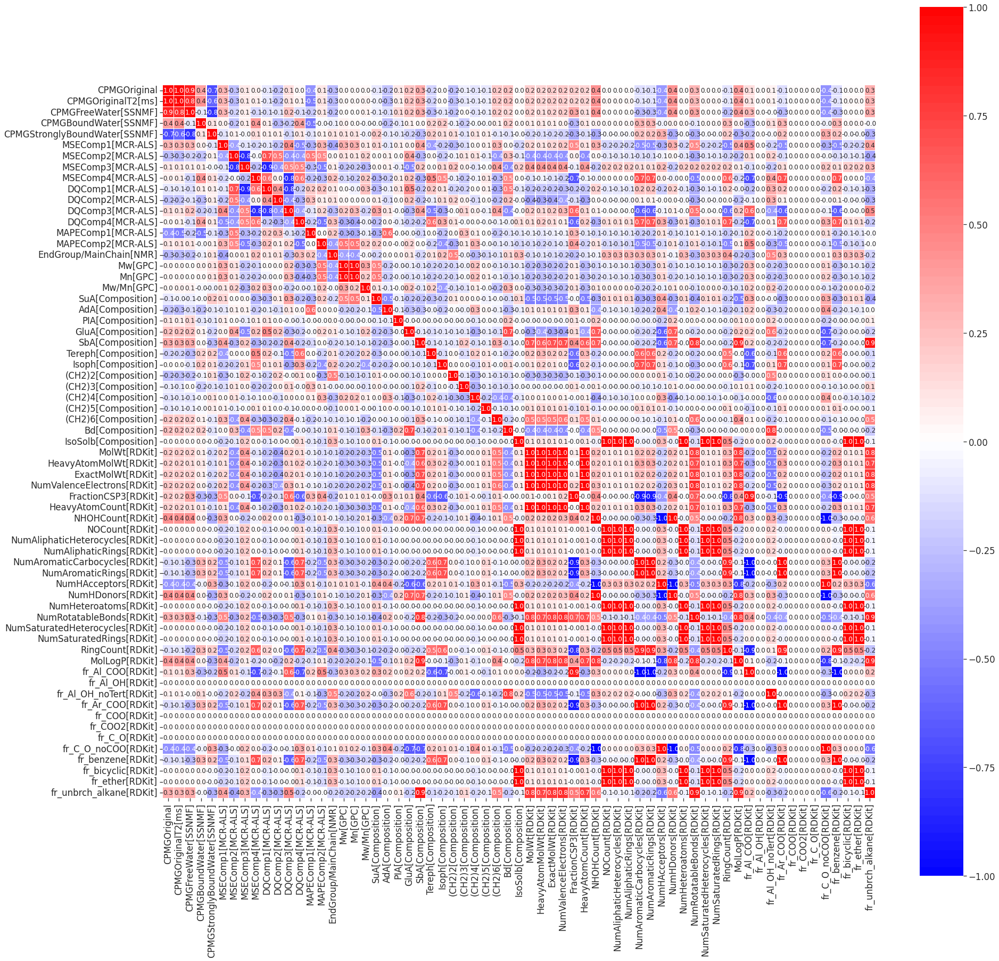

In [ ]:
import seaborn as sns

# 相関をヒートマップで可視化
plt.figure(figsize=(30,30))
upp_mat = np.triu(df_corr)
"""
sns.clustermap(df_corr, annot=None, fmt='g', cmap=sns.color_palette('bwr', 100), center=0,z_score=None, standard_scale=None,
            square=None, linewidths=.2, cbar_kws={"shrink": .5}, row_cluster=False, col_cluster=False,yticklabels = 1 , xticklabels = 1 )
"""
sns.heatmap(df_corr, annot=True,fmt=".1f",annot_kws={'fontsize':12},# データ
            #vmin=-1, vmax=1, # 範囲
            #annot=False, fmt='0.2f', # 数値表示
            cmap=sns.color_palette('bwr', 100), # 色指定coolwarm
            yticklabels = 1 , xticklabels = 1 , #ラベル間隔
             square=True, # ヒートマップを正方形で表示
            #mask = upp_mat,
            linewidths=.2)

plt.savefig('heatmap20230210.png')

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
 
from sklearn.datasets import load_boston
 
import networkx as nx
#from pyvis.network import Network

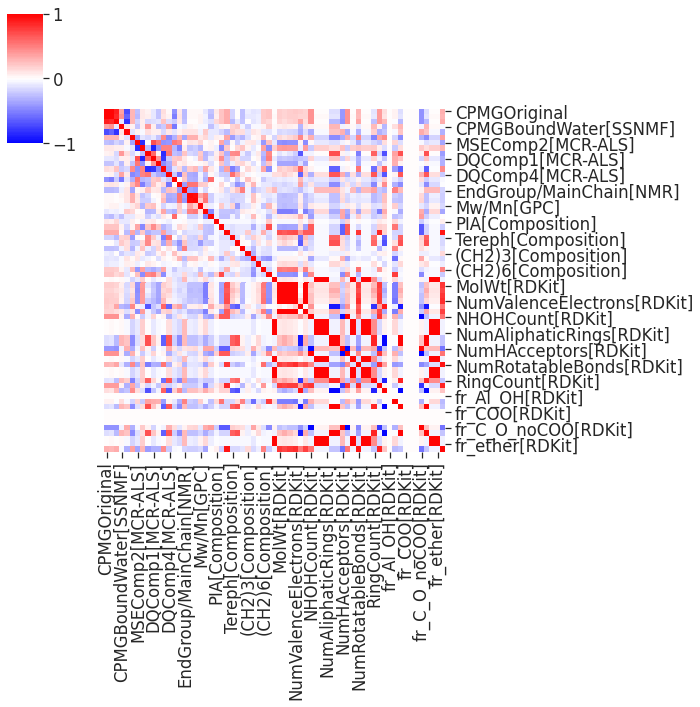

In [ ]:
# 右上の三角行列をマスク
mask_df = df_corr#.mask(np.triu(np.ones(df_corr.shape)).astype(bool), None)
mask_df
sns.clustermap(mask_df,cmap=sns.color_palette('bwr', 100), col_cluster=False, row_cluster=False)

In [ ]:
mask_df[["CPMGFreeWater[SSNMF]","CPMGStronglyBoundWater[SSNMF]"]].T

,CPMGOriginal,CPMGOriginalT2[ms],CPMGFreeWater[SSNMF],CPMGBoundWater[SSNMF],CPMGStronglyBoundWater[SSNMF],MSEComp1[MCR-ALS],MSEComp2[MCR-ALS],MSEComp3[MCR-ALS],MSEComp4[MCR-ALS],DQComp1[MCR-ALS],...,fr_Al_OH_noTert[RDKit],fr_Ar_COO[RDKit],fr_COO[RDKit],fr_COO2[RDKit],fr_C_O[RDKit],fr_C_O_noCOO[RDKit],fr_benzene[RDKit],fr_bicyclic[RDKit],fr_ether[RDKit],fr_unbrch_alkane[RDKit]
CPMGFreeWater[SSNMF],0.895430,0.845693,1.000000,-0.092631,-0.817869,0.286362,-0.165807,0.071437,-0.146712,-0.135553,...,-0.002792,-0.274779,0.0,0.0,0.0,-0.439826,-0.274779,0.009878,0.009878,0.335462
CPMGStronglyBoundWater[SSNMF],-0.719946,-0.612869,-0.817869,0.104102,1.000000,-0.118695,0.052965,-0.035202,0.137267,0.073594,...,-0.024377,0.227440,0.0,0.0,0.0,0.333047,0.227440,-0.020316,-0.020316,-0.300863


In [ ]:
edges = mask_df[["CPMGFreeWater[SSNMF]","CPMGStronglyBoundWater[SSNMF]"]].T.stack().reset_index().rename(columns={"level_0":"source", "level_1":"target", 0:"weight",})
threshold =0.2
edges_lists = edges.loc[abs(edges['weight'])> threshold] # 該当のノードのみ出したい場合コメントアウト外す
edges_lists = edges_lists.loc[abs(edges['weight'])< 1]
edges_lists = edges_lists.sort_values('weight', ascending=False)
edges_lists

,source,target,weight
0,CPMGFreeWater[SSNMF],CPMGOriginal,0.895430
1,CPMGFreeWater[SSNMF],CPMGOriginalT2[ms],0.845693
46,CPMGFreeWater[SSNMF],NumHDonors[RDKit],0.439826
39,CPMGFreeWater[SSNMF],NHOHCount[RDKit],0.439826
52,CPMGFreeWater[SSNMF],MolLogP[RDKit],0.397633
48,CPMGFreeWater[SSNMF],NumRotatableBonds[RDKit],0.349341
37,CPMGFreeWater[SSNMF],FractionCSP3[RDKit],0.344033
64,CPMGFreeWater[SSNMF],fr_unbrch_alkane[RDKit],0.335462
125,CPMGStronglyBoundWater[SSNMF],fr_C_O_noCOO[RDKit],0.333047
23,CPMGFreeWater[SSNMF],SbA[Composition],0.329295


In [ ]:
edges_lists.to_csv("edges_lists20230210freestrong.csv")

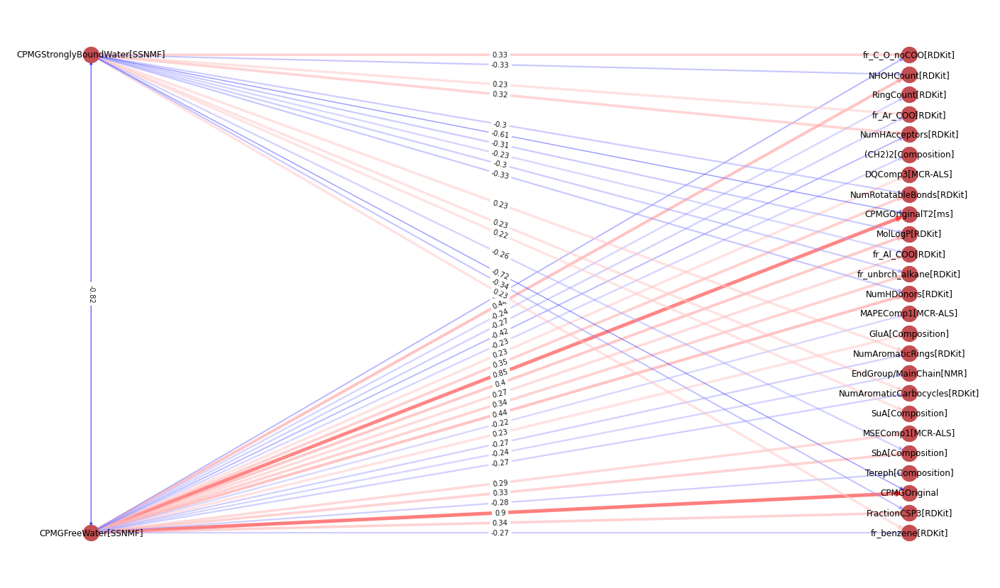

In [ ]:
import networkx as nx 
import matplotlib.pyplot as plt 
import matplotlib as mpl

#u = ['SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 
#    'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR'] 
#v = ['Intensity', 'FWHM', 'Area', 'Water+','Water-', 'Ccomp', 'Cstd', 'BF1', 
#    'D1', 'NS', 'O1', 'PROBHD', 'RG', 'SW', 'TD', 'TE', 'AT', 'calcSNR'] 
#w = [0.388, -0.085, 0.287, -0.162, 0.169, -0.034, -0.183, 0.380, 0.514, -0.260, 0.389, 0.276,0.079, 0.490, 0.436, -0.137, 0.002, -0.072] 
u=edges_lists["source"]
v=edges_lists["target"]
w=np.round(edges_lists["weight"], 2)#edges_lists["weight"]

G = nx.DiGraph() 
for ui, vi, wi in  zip(u, v, w): 
    G.add_edges_from([(ui, vi)], weight=wi) 
pos = nx.bipartite_layout(G, ["CPMGFreeWater[SSNMF]","CPMGStronglyBoundWater[SSNMF]"])#.spring_layout(G)
edge_labels = dict([((u, v,), d['weight']) for u, v, d in G.edges(data=True)]) 
weights = [G[u][v]['weight'] for u, v in G.edges()] 
weights = list(map(lambda x: (x - min(weights))/
        (max(weights) - min(weights)), weights)) 
weights = list(map(lambda x: (x * 4) + 1, weights)) 
i = 0 
for u, v in G.edges(): 
    #print(u, v, G[u][v]['weight'], weights[i]) 
    i += 1 

fig = plt.figure(figsize=(25, 15)) 

plt.axis('off') 
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels) 
nx.draw_networkx_nodes(G, pos, 
         nodelist=G.nodes(), 
         node_color='r', 
         node_size=500)
edge_col = weights
nx.draw_networkx_edges(G, pos, 
         edgelist=G.edges(), 
         alpha=0.5, edge_cmap=plt.cm.bwr, edge_color=weights, width=weights) 
nx.draw_networkx_labels(G, pos, font_size=12, font_color='black') 



ax = plt.gca()
ax.set_axis_off()
plt.savefig("network20230210.png")
plt.show()
nx.write_gml(G, "network20230210.gml")

In [ ]:
mask_df[["CPMGOriginal"]].T

,CPMGOriginal,CPMGOriginalT2[ms],CPMGFreeWater[SSNMF],CPMGBoundWater[SSNMF],CPMGStronglyBoundWater[SSNMF],MSEComp1[MCR-ALS],MSEComp2[MCR-ALS],MSEComp3[MCR-ALS],MSEComp4[MCR-ALS],DQComp1[MCR-ALS],...,fr_Al_OH_noTert[RDKit],fr_Ar_COO[RDKit],fr_COO[RDKit],fr_COO2[RDKit],fr_C_O[RDKit],fr_C_O_noCOO[RDKit],fr_benzene[RDKit],fr_bicyclic[RDKit],fr_ether[RDKit],fr_unbrch_alkane[RDKit]
CPMGOriginal,1.0,0.984151,0.89543,0.360012,-0.719946,0.288346,-0.254218,0.096114,0.044496,-0.096085,...,0.054521,-0.123825,0.0,0.0,0.0,-0.435495,-0.123825,0.018373,0.018373,0.300578


In [ ]:
edges = mask_df[["CPMGOriginal"]].T.stack().reset_index().rename(columns={"level_0":"source", "level_1":"target", 0:"weight",})
threshold =0.2
edges_lists = edges.loc[abs(edges['weight'])> threshold] # 該当のノードのみ出したい場合コメントアウト外す
edges_lists = edges_lists.loc[abs(edges['weight'])< 1]
edges_lists = edges_lists.sort_values('weight', ascending=False)
edges_lists

,source,target,weight
1,CPMGOriginal,CPMGOriginalT2[ms],0.984151
2,CPMGOriginal,CPMGFreeWater[SSNMF],0.895430
46,CPMGOriginal,NumHDonors[RDKit],0.435495
39,CPMGOriginal,NHOHCount[RDKit],0.435495
52,CPMGOriginal,MolLogP[RDKit],0.394505
3,CPMGOriginal,CPMGBoundWater[SSNMF],0.360012
23,CPMGOriginal,SbA[Composition],0.325792
64,CPMGOriginal,fr_unbrch_alkane[RDKit],0.300578
5,CPMGOriginal,MSEComp1[MCR-ALS],0.288346
48,CPMGOriginal,NumRotatableBonds[RDKit],0.282680


In [ ]:
edges_lists.to_csv("edges_lists20230210original.csv")

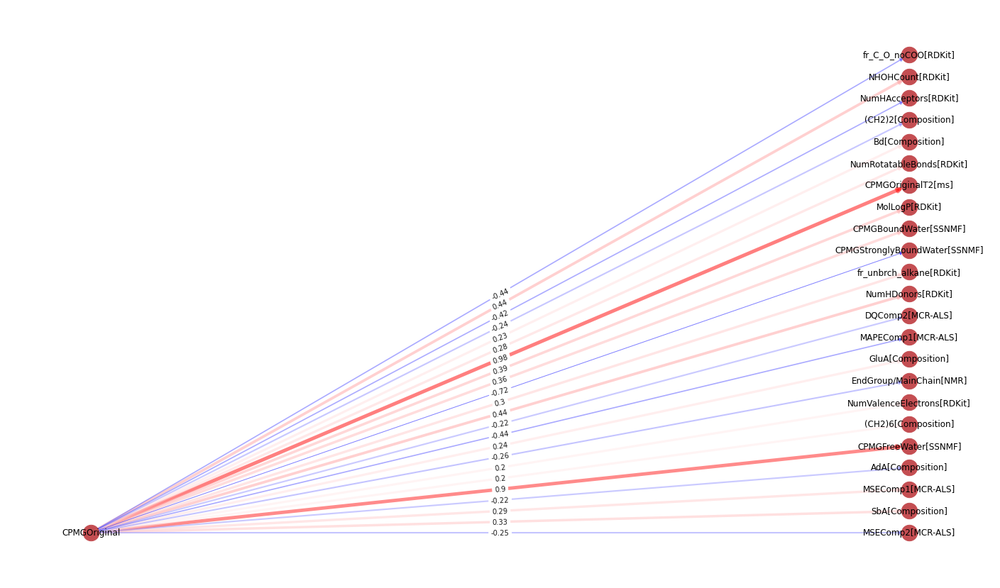

In [ ]:
import networkx as nx 
import matplotlib.pyplot as plt 
import matplotlib as mpl

#u = ['SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 
#    'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR'] 
#v = ['Intensity', 'FWHM', 'Area', 'Water+','Water-', 'Ccomp', 'Cstd', 'BF1', 
#    'D1', 'NS', 'O1', 'PROBHD', 'RG', 'SW', 'TD', 'TE', 'AT', 'calcSNR'] 
#w = [0.388, -0.085, 0.287, -0.162, 0.169, -0.034, -0.183, 0.380, 0.514, -0.260, 0.389, 0.276,0.079, 0.490, 0.436, -0.137, 0.002, -0.072] 
u=edges_lists["source"]
v=edges_lists["target"]
w=np.round(edges_lists["weight"], 2)#edges_lists["weight"]

G = nx.DiGraph() 
for ui, vi, wi in  zip(u, v, w): 
    G.add_edges_from([(ui, vi)], weight=wi) 
pos = nx.bipartite_layout(G, ["CPMGOriginal"])#,"CPMGOriginal".spring_layout(G)
edge_labels = dict([((u, v,), d['weight']) for u, v, d in G.edges(data=True)]) 
weights = [G[u][v]['weight'] for u, v in G.edges()] 
weights = list(map(lambda x: (x - min(weights))/
        (max(weights) - min(weights)), weights)) 
weights = list(map(lambda x: (x * 4) + 1, weights)) 
i = 0 
for u, v in G.edges(): 
    #print(u, v, G[u][v]['weight'], weights[i]) 
    i += 1 

fig = plt.figure(figsize=(25, 15)) 

plt.axis('off') 
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels) 
nx.draw_networkx_nodes(G, pos, 
         nodelist=G.nodes(), 
         node_color='r', 
         node_size=500)
edge_col = weights
nx.draw_networkx_edges(G, pos, 
         edgelist=G.edges(), 
         alpha=0.5, edge_cmap=plt.cm.bwr, edge_color=weights, width=weights) 
nx.draw_networkx_labels(G, pos, font_size=12, font_color='black') 



ax = plt.gca()
ax.set_axis_off()
plt.savefig("network20230210.png")
plt.show()
nx.write_gml(G, "network20230210.gml")

In [ ]:
mask_df[["CPMGOriginalT2[ms]"]].T

,CPMGOriginal,CPMGOriginalT2[ms],CPMGFreeWater[SSNMF],CPMGBoundWater[SSNMF],CPMGStronglyBoundWater[SSNMF],MSEComp1[MCR-ALS],MSEComp2[MCR-ALS],MSEComp3[MCR-ALS],MSEComp4[MCR-ALS],DQComp1[MCR-ALS],...,fr_Al_OH_noTert[RDKit],fr_Ar_COO[RDKit],fr_COO[RDKit],fr_COO2[RDKit],fr_C_O[RDKit],fr_C_O_noCOO[RDKit],fr_benzene[RDKit],fr_bicyclic[RDKit],fr_ether[RDKit],fr_unbrch_alkane[RDKit]
CPMGOriginalT2[ms],0.984151,1.0,0.845693,0.42909,-0.612869,0.296899,-0.268256,0.097756,0.073076,-0.092195,...,0.053191,-0.106445,0.0,0.0,0.0,-0.423096,-0.106445,0.023646,0.023646,0.283962


In [ ]:
edges = mask_df[["CPMGOriginalT2[ms]"]].T.stack().reset_index().rename(columns={"level_0":"source", "level_1":"target", 0:"weight",})
threshold =0.2
edges_lists = edges.loc[abs(edges['weight'])> threshold] # 該当のノードのみ出したい場合コメントアウト外す
edges_lists = edges_lists.loc[abs(edges['weight'])< 1]
edges_lists = edges_lists.sort_values('weight', ascending=False)
edges_lists

,source,target,weight
0,CPMGOriginalT2[ms],CPMGOriginal,0.984151
2,CPMGOriginalT2[ms],CPMGFreeWater[SSNMF],0.845693
3,CPMGOriginalT2[ms],CPMGBoundWater[SSNMF],0.429090
46,CPMGOriginalT2[ms],NumHDonors[RDKit],0.423096
39,CPMGOriginalT2[ms],NHOHCount[RDKit],0.423096
52,CPMGOriginalT2[ms],MolLogP[RDKit],0.381237
23,CPMGOriginalT2[ms],SbA[Composition],0.321402
5,CPMGOriginalT2[ms],MSEComp1[MCR-ALS],0.296899
64,CPMGOriginalT2[ms],fr_unbrch_alkane[RDKit],0.283962
48,CPMGOriginalT2[ms],NumRotatableBonds[RDKit],0.263008


In [ ]:
edges_lists.to_csv("edges_lists20230210t2.csv")

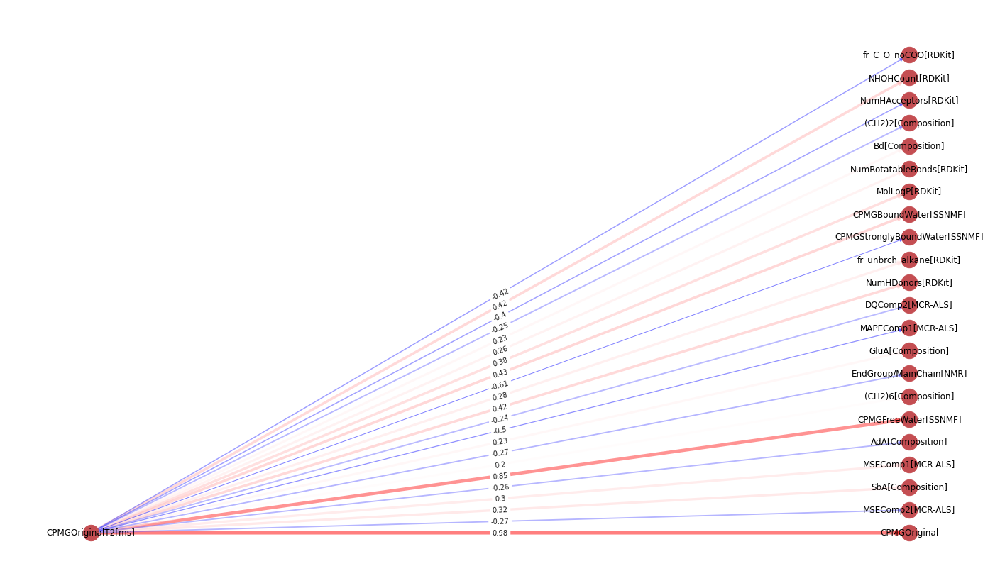

In [ ]:
import networkx as nx 
import matplotlib.pyplot as plt 
import matplotlib as mpl

#u = ['SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 
#    'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR'] 
#v = ['Intensity', 'FWHM', 'Area', 'Water+','Water-', 'Ccomp', 'Cstd', 'BF1', 
#    'D1', 'NS', 'O1', 'PROBHD', 'RG', 'SW', 'TD', 'TE', 'AT', 'calcSNR'] 
#w = [0.388, -0.085, 0.287, -0.162, 0.169, -0.034, -0.183, 0.380, 0.514, -0.260, 0.389, 0.276,0.079, 0.490, 0.436, -0.137, 0.002, -0.072] 
u=edges_lists["source"]
v=edges_lists["target"]
w=np.round(edges_lists["weight"], 2)#edges_lists["weight"]

G = nx.DiGraph() 
for ui, vi, wi in  zip(u, v, w): 
    G.add_edges_from([(ui, vi)], weight=wi) 
pos = nx.bipartite_layout(G, ["CPMGOriginalT2[ms]"])#,"CPMGOriginal".spring_layout(G)
edge_labels = dict([((u, v,), d['weight']) for u, v, d in G.edges(data=True)]) 
weights = [G[u][v]['weight'] for u, v in G.edges()] 
weights = list(map(lambda x: (x - min(weights))/
        (max(weights) - min(weights)), weights)) 
weights = list(map(lambda x: (x * 4) + 1, weights)) 
i = 0 
for u, v in G.edges(): 
    #print(u, v, G[u][v]['weight'], weights[i]) 
    i += 1 

fig = plt.figure(figsize=(25, 15)) 

plt.axis('off') 
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels) 
nx.draw_networkx_nodes(G, pos, 
         nodelist=G.nodes(), 
         node_color='r', 
         node_size=500)
edge_col = weights
nx.draw_networkx_edges(G, pos, 
         edgelist=G.edges(), 
         alpha=0.5, edge_cmap=plt.cm.bwr, edge_color=weights, width=weights) 
nx.draw_networkx_labels(G, pos, font_size=12, font_color='black') 



ax = plt.gca()
ax.set_axis_off()
plt.savefig("network20230210.png")
plt.show()
nx.write_gml(G, "network20230210.gml")

In [ ]:
mask_df[["CPMGBoundWater[SSNMF]"]].T

,CPMGOriginal,CPMGOriginalT2[ms],CPMGFreeWater[SSNMF],CPMGBoundWater[SSNMF],CPMGStronglyBoundWater[SSNMF],MSEComp1[MCR-ALS],MSEComp2[MCR-ALS],MSEComp3[MCR-ALS],MSEComp4[MCR-ALS],DQComp1[MCR-ALS],...,fr_Al_OH_noTert[RDKit],fr_Ar_COO[RDKit],fr_COO[RDKit],fr_COO2[RDKit],fr_C_O[RDKit],fr_C_O_noCOO[RDKit],fr_benzene[RDKit],fr_bicyclic[RDKit],fr_ether[RDKit],fr_unbrch_alkane[RDKit]
CPMGBoundWater[SSNMF],0.360012,0.42909,-0.092631,1.0,0.104102,0.044816,-0.226789,0.072619,0.402658,0.061348,...,0.129013,0.296115,0.0,0.0,0.0,-0.048761,0.296115,0.024135,0.024135,-0.030395


In [ ]:
edges = mask_df[["CPMGBoundWater[SSNMF]"]].T.stack().reset_index().rename(columns={"level_0":"source", "level_1":"target", 0:"weight",})
threshold =0.2
edges_lists = edges.loc[abs(edges['weight'])> threshold] # 該当のノードのみ出したい場合コメントアウト外す
edges_lists = edges_lists.loc[abs(edges['weight'])< 1]
edges_lists = edges_lists.sort_values('weight', ascending=False)
edges_lists

,source,target,weight
1,CPMGBoundWater[SSNMF],CPMGOriginalT2[ms],0.429090
8,CPMGBoundWater[SSNMF],MSEComp4[MCR-ALS],0.402658
12,CPMGBoundWater[SSNMF],DQComp4[MCR-ALS],0.368674
0,CPMGBoundWater[SSNMF],CPMGOriginal,0.360012
56,CPMGBoundWater[SSNMF],fr_Ar_COO[RDKit],0.296115
44,CPMGBoundWater[SSNMF],NumAromaticRings[RDKit],0.296115
43,CPMGBoundWater[SSNMF],NumAromaticCarbocycles[RDKit],0.296115
61,CPMGBoundWater[SSNMF],fr_benzene[RDKit],0.296115
51,CPMGBoundWater[SSNMF],RingCount[RDKit],0.276066
25,CPMGBoundWater[SSNMF],Isoph[Composition],0.212686


In [ ]:
edges_lists.to_csv("edges_lists20230210boundwater.csv")

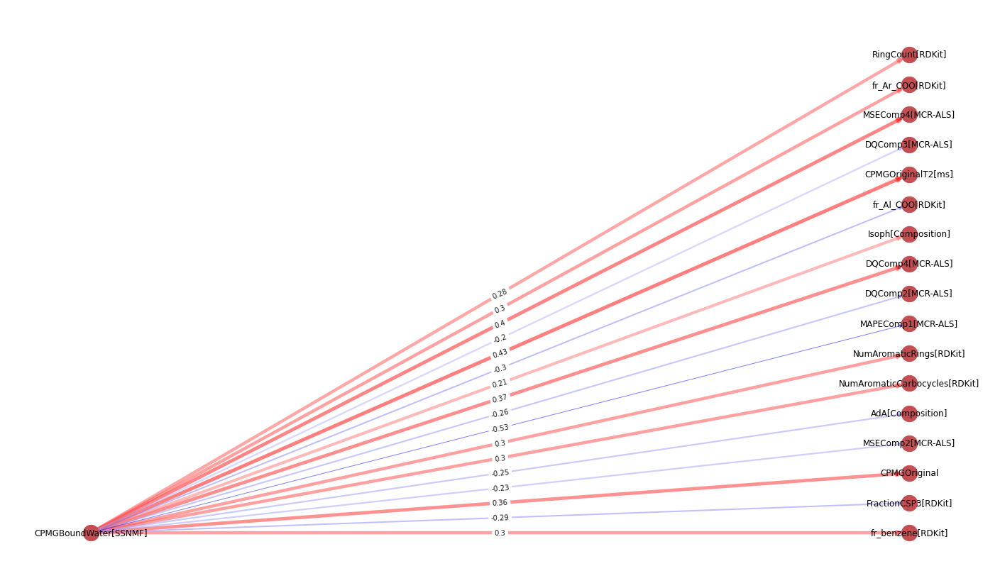

In [ ]:
import networkx as nx 
import matplotlib.pyplot as plt 
import matplotlib as mpl

#u = ['SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 
#    'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR', 'SNR'] 
#v = ['Intensity', 'FWHM', 'Area', 'Water+','Water-', 'Ccomp', 'Cstd', 'BF1', 
#    'D1', 'NS', 'O1', 'PROBHD', 'RG', 'SW', 'TD', 'TE', 'AT', 'calcSNR'] 
#w = [0.388, -0.085, 0.287, -0.162, 0.169, -0.034, -0.183, 0.380, 0.514, -0.260, 0.389, 0.276,0.079, 0.490, 0.436, -0.137, 0.002, -0.072] 
u=edges_lists["source"]
v=edges_lists["target"]
w=np.round(edges_lists["weight"], 2)#edges_lists["weight"]

G = nx.DiGraph() 
for ui, vi, wi in  zip(u, v, w): 
    G.add_edges_from([(ui, vi)], weight=wi) 
pos = nx.bipartite_layout(G, ["CPMGBoundWater[SSNMF]"])#,"CPMGOriginal".spring_layout(G)
edge_labels = dict([((u, v,), d['weight']) for u, v, d in G.edges(data=True)]) 
weights = [G[u][v]['weight'] for u, v in G.edges()] 
weights = list(map(lambda x: (x - min(weights))/
        (max(weights) - min(weights)), weights)) 
weights = list(map(lambda x: (x * 4) + 1, weights)) 
i = 0 
for u, v in G.edges(): 
    #print(u, v, G[u][v]['weight'], weights[i]) 
    i += 1 

fig = plt.figure(figsize=(25, 15)) 

plt.axis('off') 
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels) 
nx.draw_networkx_nodes(G, pos, 
         nodelist=G.nodes(), 
         node_color='r', 
         node_size=500)
edge_col = weights
nx.draw_networkx_edges(G, pos, 
         edgelist=G.edges(), 
         alpha=0.5, edge_cmap=plt.cm.bwr, edge_color=weights, width=weights) 
nx.draw_networkx_labels(G, pos, font_size=12, font_color='black') 



ax = plt.gca()
ax.set_axis_off()
plt.savefig("network20230210.png")
plt.show()
nx.write_gml(G, "network20230210.gml")